<hr style="height:10px">

<div class='container2'>
		<div>
			<img src=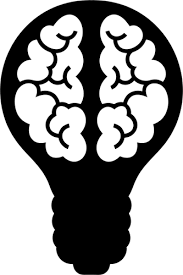 ALIGN='left' style='width:10em'>
		</div>
	<div style='padding: 0 7em 2em 12em;'>
	<h1>Laboratório de Inovação e Automação 1 (LIA 1)</h1>
    <div style="font-size:12pt;float:left;"><b>Projetos de Inteligência Artificial - Classificação de imagens </b></div>
	</div>
</div>

 <hr style="height:5px">

Notebook desenvolvido por: <a href="https://br.linkedin.com/in/larissa-rosa-82736b215">Larissa Silva Xavier Rosa</a>

 <hr style="height:2px">

# 1. Importações de Bibliotecas

Nesta etapa, importamos todas as bibliotecas que serão utilizadas ao longo do projeto:

- Manipulação de arquivos e diretórios (`os`, `pathlib`, `shutil`)
- Visualização de imagens e métricas (`matplotlib`)
- Processamento de dados e divisão de conjuntos (`sklearn`)
- Modelagem e treinamento com `TensorFlow` e `Keras`

In [1]:
!pip install kaggle python-dotenv -q

In [2]:
import os
import shutil
import random
import zipfile
import datetime
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from pathlib import Path
from dotenv import load_dotenv
from tensorflow.keras import Input
from collections import defaultdict
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score
from tensorflow.keras.layers import Lambda, Conv2D, MaxPooling2D, GlobalAveragePooling2D, Flatten, Dense, Dropout

# 2. Extração e manipulação dos dados

Realizamos a extração do arquivo `.zip` que contém as imagens de cães e gatos.

- Como o `.zip` possui uma pasta intermediária (`PetImages`), usamos uma **pasta temporária** para extrair e reorganizar os dados.
- Criamos a estrutura final de diretórios `/train`, `/val`, `/test` com subpastas `Cat` e `Dog`.
- Dividimos as imagens automaticamente com proporções 80% treino, 10% validação e 10% teste.


In [3]:
!gdown 1qv1XdOJ2YvIooB4r9pmxY-kY2HwVHiQ6

Downloading...
From: https://drive.google.com/uc?id=1qv1XdOJ2YvIooB4r9pmxY-kY2HwVHiQ6
To: /content/.env
100% 74.0/74.0 [00:00<00:00, 317kB/s]


In [4]:
# Carrega as variáveis do arquivo .env para o ambiente do sistema
load_dotenv(".env")
os.environ['KAGGLE_USERNAME'] = os.getenv('KAGGLE_USERNAME')
os.environ['KAGGLE_KEY'] = os.getenv('KAGGLE_KEY')

In [5]:
# --- 📥 Baixar e extrair o dataset com API do Kaggle ---
!kaggle datasets download bhavikjikadara/dog-and-cat-classification-dataset

Dataset URL: https://www.kaggle.com/datasets/bhavikjikadara/dog-and-cat-classification-dataset
License(s): apache-2.0


In [6]:
# Caminho do zip baixado
zip_path = "/content/dog-and-cat-classification-dataset.zip"
output_dir = "/content/dataset"
os.makedirs(output_dir, exist_ok=True)

In [8]:
# Extrair o zip
!unzip -q {zip_path} -d /content/

In [9]:
random.seed(42)  # Reprodutibilidade

# Caminhos
original_dataset = Path("/content/PetImages")
base_dir = Path(output_dir)
splits = ["train", "val", "test"]
split_ratio = [0.8, 0.1, 0.1]

# Criar diretórios destino
for split in splits:
    for class_name in ["Cat", "Dog"]:
        (base_dir / split / class_name).mkdir(parents=True, exist_ok=True)

# Organizar imagens
for class_name in ["Cat", "Dog"]:
    images = list((original_dataset / class_name).glob("*.jpg"))
    valid_images = [img for img in images if img.stat().st_size > 0]  # ignora imagens corrompidas
    print(f"📁 {class_name}: {len(valid_images)} imagens válidas.")
    random.shuffle(images)

    n_total = len(images)
    n_train = int(split_ratio[0] * n_total)
    n_val = int(split_ratio[1] * n_total)

    for i, img_path in enumerate(images):
        if i < n_train:
            split = "train"
        elif i < n_train + n_val:
            split = "val"
        else:
            split = "test"
        dest = base_dir / split / class_name / img_path.name
        try:
            shutil.copy(img_path, dest)
        except:
            pass  # Ignorar imagens corrompidas

📁 Cat: 12499 imagens válidas.
📁 Dog: 12499 imagens válidas.


In [25]:
# --- Contar número de imagens por classe em cada split ---

splits = ["train", "val", "test"]
classes = ["Cat", "Dog"]

for split in splits:
      count = len(list((base_dir / split).glob("*/*.jpg")))
      print(f"📁  {split}: {count} imagens")

📁  train: 19998 imagens
📁  val: 2498 imagens
📁  test: 2502 imagens


# 3. Exibição de amostras

Selecionamos e exibimos 5 imagens de cada classe para garantir visualmente que a divisão foi feita corretamente e os dados estão acessíveis e balanceados.


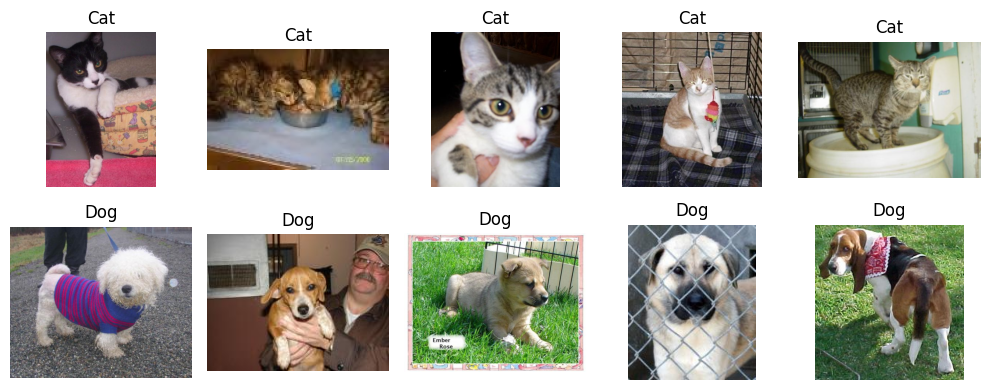

In [11]:
# Exibe 5 imagens da classe Cat e 5 da classe Dog
sample_cats = list((Path(f'{output_dir}/train/Cat')).glob("*.jpg"))[:5]
sample_dogs = list((Path(f'{output_dir}/train/Dog')).glob("*.jpg"))[:5]

plt.figure(figsize=(10, 4))
for i, img_path in enumerate(sample_cats + sample_dogs):
    img = mpimg.imread(img_path)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title("Cat" if i < 5 else "Dog")
plt.tight_layout()
plt.show()

# 4. Preparo dos dados
Utilizamos o `ImageDataGenerator` do Keras para:

- Normalizar os pixels (rescale) das imagens.
- Gerar os dados em lotes (batches) diretamente das pastas organizadas.


In [12]:
img_size = (224, 224)
batch_size = 16

In [13]:
train_dir = Path(f"{output_dir}/train")
val_dir = Path(f"{output_dir}/val")
test_dir = Path(f"{output_dir}/test")

In [15]:
AUTOTUNE = tf.data.AUTOTUNE

# Caminho das pastas
train_ds = image_dataset_from_directory(
    directory=train_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int',
    shuffle=True
).prefetch(buffer_size=AUTOTUNE)

val_ds = image_dataset_from_directory(
    directory=val_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int'
).prefetch(buffer_size=AUTOTUNE)

test_ds = image_dataset_from_directory(
    directory=test_dir,
    image_size=img_size,
    batch_size=batch_size,
    label_mode='int',
    shuffle=False
).prefetch(buffer_size=AUTOTUNE)

Found 19998 files belonging to 2 classes.
Found 2498 files belonging to 2 classes.
Found 2502 files belonging to 2 classes.


In [16]:
print("🔎 Checando formato dos dados:")

for images, labels in train_ds.take(1):
    print("Train images shape:", images.shape)
    print("Train labels shape:", labels.shape)

for images, labels in val_ds.take(1):
    print("Val images shape:", images.shape)
    print("Val labels shape:", labels.shape)


🔎 Checando formato dos dados:
Train images shape: (16, 224, 224, 3)
Train labels shape: (16,)
Val images shape: (16, 224, 224, 3)
Val labels shape: (16,)


# 5. Definição do modelo e callbacks

Criamos um modelo com base na arquitetura **MobileNetV2**, pré-treinada no ImageNet:

- Reaproveitamos o conhecimento do modelo sem reentreinar desde o zero.
- Adicionamos camadas finais para adaptação ao nosso problema binário (gato vs cachorro).

Configuramos **três callbacks importantes** para o processo de treinamento:

- `ModelCheckpoint`: salva o melhor modelo automaticamente.
- `EarlyStopping`: evita overfitting interrompendo o treino se não houver melhora.
- `TensorBoard`: registra os logs do treinamento para visualização interativa.

In [104]:
# --- 🧠 Modelo com EfficientNetB0 + Fine Tuning ---
base_model = EfficientNetB0(
    input_shape=(*img_size, 3),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # ou True para fine-tuning depois

In [123]:
model = Sequential([
    Lambda(preprocess_input, input_shape=(*img_size, 3)),
    base_model,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.4),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/lambda_layer.py:65: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_4           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_9 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_10 (Dropout)                 │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,221,860 (16.11 MB)

 Trainable params: 172,289 (673.00 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [124]:
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
              loss="binary_crossentropy",
              metrics=["accuracy"])

log_dir = "logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
callbacks = [
    ModelCheckpoint("best_model.keras", save_best_only=True),
    EarlyStopping(monitor='val_accuracy',patience=5, restore_best_weights=True,verbose=1),
    TensorBoard(log_dir=log_dir)
]

# 6. Treinamento

Treinamos o modelo utilizando:

- Dados do conjunto de treino
- Validação a cada época
- Callbacks para salvar o melhor desempenho

In [125]:
epochs = 15

In [126]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs,
    callbacks=callbacks
)

Epoch 1/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 77s 44ms/step - accuracy: 0.9330 - loss: 0.2022 - val_accuracy: 0.9916 - val_loss: 0.0271
Epoch 2/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 54s 30ms/step - accuracy: 0.9923 - loss: 0.0265 - val_accuracy: 0.9920 - val_loss: 0.0251
Epoch 3/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - accuracy: 0.9924 - loss: 0.0226 - val_accuracy: 0.9924 - val_loss: 0.0244
Epoch 4/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - accuracy: 0.9944 - loss: 0.0185 - val_accuracy: 0.9916 - val_loss: 0.0252
Epoch 5/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 77s 29ms/step - accuracy: 0.9952 - loss: 0.0169 - val_accuracy: 0.9936 - val_loss: 0.0235
Epoch 6/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 39s 28ms/step - accuracy: 0.9953 - loss: 0.0152 - val_accuracy: 0.9932 - val_loss: 0.0244
Epoch 7/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 41s 27ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.9920 - val_loss: 0.0250
Epoch 8/15
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 40s 27ms/step - accuracy: 0.9960 -

# 7. Métricas do treinamento
Plotamos gráficos mostrando:

- A evolução da **acurácia** e da **perda (loss)** durante o treinamento
- Diferenças entre treino e validação, úteis para análise de overfitting ou underfitting
- Os gráficos são também salvos como imagens (`.png`)

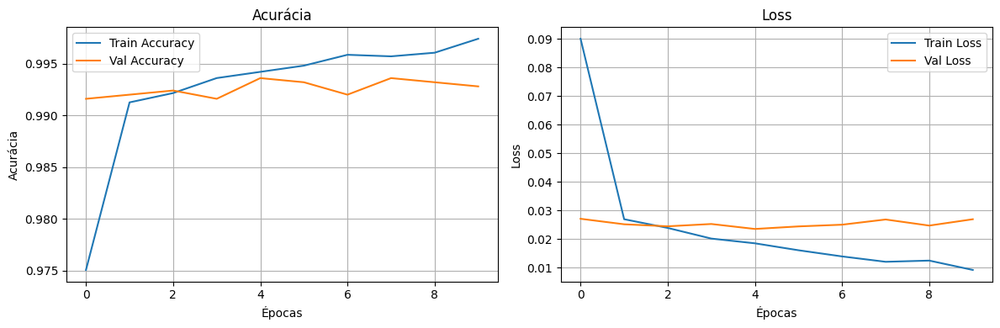

In [127]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Acurácia')
plt.xlabel('Épocas')
plt.ylabel('Acurácia')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Loss')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.savefig("training_metrics.png")
plt.show()

In [128]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 29920), started 0:16:19 ago. (Use '!kill 29920' to kill it.)

<IPython.core.display.Javascript object>

# 8. Avaliação do modelo nos dados de teste

Avaliamos o modelo final (melhor versão salva) no conjunto de teste e exibimos a **acurácia final**.


In [129]:
test_loss, test_acc = model.evaluate(test_ds)
print(f"\nTest accuracy: {test_acc:.4f}")

157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step - accuracy: 0.9938 - loss: 0.0193

Test accuracy: 0.9928


> Mostrando as predições de alguns exemplos de teste

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step


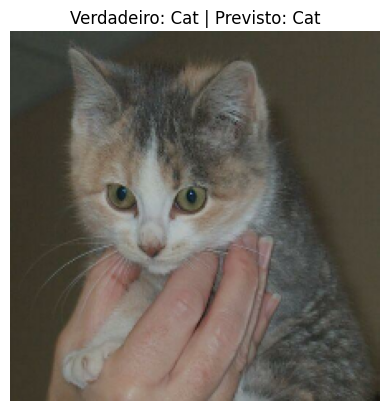

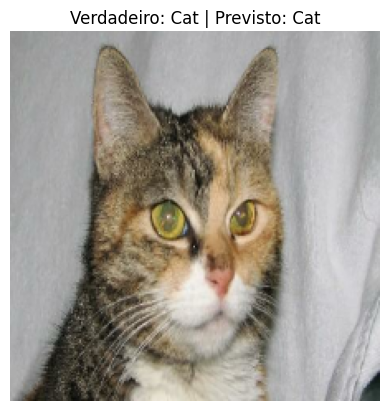

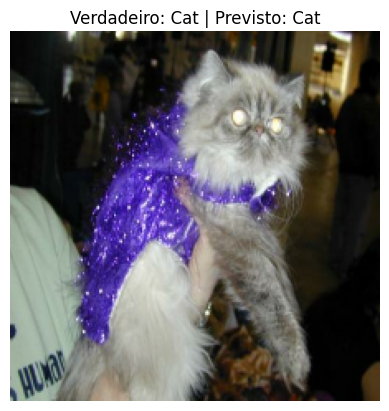

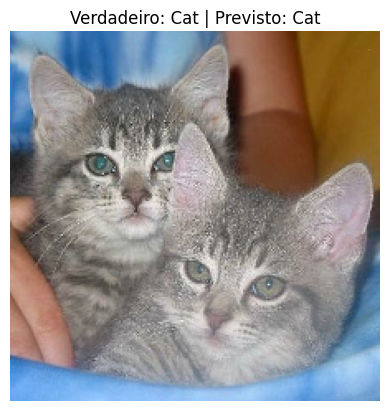

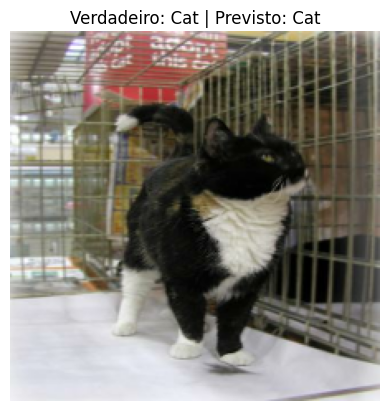

In [139]:
# Iterar no test_ds e mostrar predições de 5 imagens
for images, labels in test_ds.take(1):  # pega um batch
    preds = model.predict(images)
    for i in range(5):
        img = images[i].numpy().astype("uint8")
        pred_prob = preds[i][0]
        label_pred = "Dog" if pred_prob > 0.5 else "Cat"
        label_true = "Dog" if labels[i].numpy() == 1 else "Cat"

        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Verdadeiro: {label_true} | Previsto: {label_pred}")
        plt.show()


# 9. Matriz de confusão
Geramos:

- **Matriz de confusão**: mostra onde o modelo mais acerta e onde erra
- **Relatório de classificação**: traz métricas como precisão, recall e F1-score para cada classe



157/157 ━━━━━━━━━━━━━━━━━━━━ 17s 67ms/step


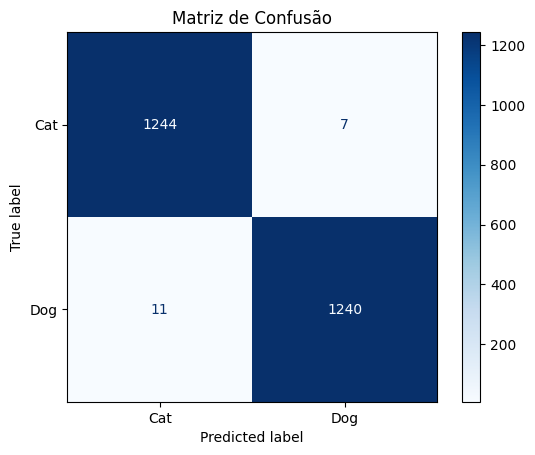

In [131]:
# --- Obter os rótulos reais (y_true) ---
y_true = []
for _, labels in test_ds:
    y_true.extend(labels.numpy())
y_true = np.array(y_true)

# --- Obter as predições (y_pred) ---
y_pred_probs = model.predict(test_ds)
y_pred = (y_pred_probs > 0.5).astype(int).flatten()

# --- Matriz de confusão ---
cm = confusion_matrix(y_true, y_pred)

# --- Exibir a matriz ---
disp = ConfusionMatrixDisplay(cm, display_labels=["Cat", "Dog"])
disp.plot(cmap="Blues")
plt.title("Matriz de Confusão")
plt.savefig("confusion_matrix.png")  # salva como imagem (opcional)
plt.show()

In [132]:
print("\n📋 Relatório de Classificação:")
print(classification_report(y_true, y_pred, target_names=["Cat", "Dog"], zero_division=0))


📋 Relatório de Classificação:
              precision    recall  f1-score   support

         Cat       0.99      0.99      0.99      1251
         Dog       0.99      0.99      0.99      1251

    accuracy                           0.99      2502
   macro avg       0.99      0.99      0.99      2502
weighted avg       0.99      0.99      0.99      2502



# 10. Bônus: teste com imagens reais

Fazemos predições reais com o modelo sobre imagens de mundo real.

- Exibimos a imagem
- Mostramos o rótulo verdadeiro e o rótulo previsto

In [133]:
!gdown 1BaUzquHaIzCJwBXo7NAAf6U40ek_OYg4
!gdown 1Vrqkzjc91qy7daZNvZwrhtcqcyunNHFm
!gdown 152jP7GfdGWAkJfQ1se9w8ElZauP10M-o
!gdown 1echBAoig61q64v05y_Ew7yzU10AguEVD
!gdown 1lbEqLzdDTJGLlIoJhA-j2yWr4ePkFadv

Downloading...
From: https://drive.google.com/uc?id=1BaUzquHaIzCJwBXo7NAAf6U40ek_OYg4
To: /content/Nala_Simba-1.jpg
100% 817k/817k [00:00<00:00, 138MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Vrqkzjc91qy7daZNvZwrhtcqcyunNHFm
To: /content/Nala_Simba-2.jpg
100% 195k/195k [00:00<00:00, 90.1MB/s]
Downloading...
From: https://drive.google.com/uc?id=152jP7GfdGWAkJfQ1se9w8ElZauP10M-o
To: /content/Floquinho_1.jpg
100% 48.4k/48.4k [00:00<00:00, 104MB/s]
Downloading...
From: https://drive.google.com/uc?id=1echBAoig61q64v05y_Ew7yzU10AguEVD
To: /content/Floquinho_3.jpg
100% 1.31M/1.31M [00:00<00:00, 165MB/s]
Downloading...
From: https://drive.google.com/uc?id=1lbEqLzdDTJGLlIoJhA-j2yWr4ePkFadv
To: /content/Floquinho_2.jpg
100% 3.56M/3.56M [00:00<00:00, 195MB/s]


In [134]:
imgs_teste_real = list(Path("/content").glob("*.jpg"))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


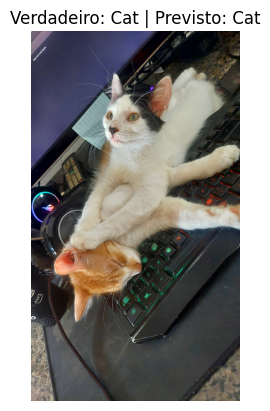

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


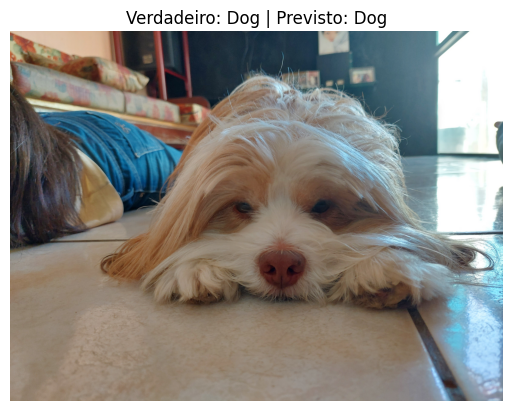

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


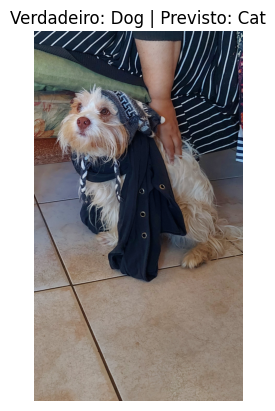

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


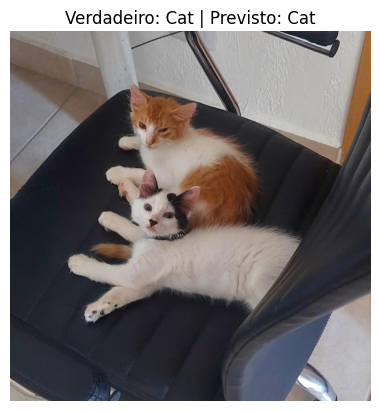

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


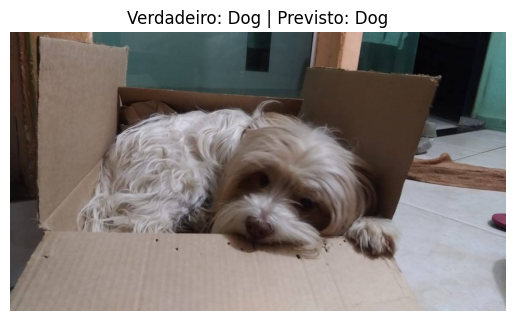

In [138]:
for img_path in imgs_teste_real:
    img = load_img(img_path, target_size=img_size)
    img_name = str(img_path).split("/")[-1]
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)

    pred = model.predict(img_array)[0][0]
    label_pred = "Dog" if pred > 0.5 else "Cat"
    label_true = "Dog" if "Floquinho" in img_name else "Cat"

    plt.imshow(mpimg.imread(img_path))
    plt.axis('off')
    plt.title(f"Verdadeiro: {label_true} | Previsto: {label_pred}")
    plt.show()